## Step 1: Install libraries and imports

In [ ]:
!pip install -q librosa soundfile matplotlib numpy IPython

In [ ]:
import os
import io
import numpy as np
import librosa
import librosa.display
import soundfile as sf
import matplotlib.pyplot as plt
from IPython.display import Audio, display
from google.colab import files

## Step 2: Upload 3 preprocessed audio files

In [ ]:
print("Use the file chooser to upload your 3 preprocessed audio files:")
uploaded = files.upload()   # interactively upload files

# Save uploaded files to /content/audios
os.makedirs('/content/audios', exist_ok=True)
for fname, filebytes in uploaded.items():
    path = os.path.join('/content/audios', fname)
    with open(path, 'wb') as f:
        f.write(filebytes)
print("Uploaded files:", os.listdir('/content/audios'))

Use the file chooser to upload your 3 preprocessed audio files:


Saving [cel][cla]0001__1.wav to [cel][cla]0001__1 (2).wav
Saving [flu][cla]0346__1.wav to [flu][cla]0346__1 (2).wav
Saving [pia][cla]1283__1.wav to [pia][cla]1283__1 (2).wav
Uploaded files: ['[flu][cla]0346__1 (1).wav', '[cel][cla]0001__1 (1).wav', '[pia][cla]1283__1 (1).wav', '[cel][cla]0001__1 (2).wav', '[pia][cla]1283__1.wav', '[flu][cla]0346__1 (2).wav', '[cel][cla]0001__1.wav', '[pia][cla]1283__1 (2).wav', '[flu][cla]0346__1.wav']


## Step 3: Helper functions

In [ ]:
def load_audio(path, sr=16000, mono=True, normalize=True):
    """Load audio with librosa and optionally resample/mono/normalize."""
    y, orig_sr = librosa.load(path, sr=sr, mono=mono)  # librosa loads floats [-1,1]
    if normalize:
        max_val = np.max(np.abs(y)) + 1e-9
        y = y / max_val
    return y, sr

def save_audio(path, y, sr):
    """Save audio file using soundfile (float32)."""
    sf.write(path, y.astype(np.float32), sr)
    return path

def plot_wave_and_mel(y, sr, title=None, figsize=(10,4)):
    fig, ax = plt.subplots(1,2, figsize=figsize)

    # waveform
    librosa.display.waveshow(y, sr=sr, ax=ax[0])
    ax[0].set(title='Waveform')

    # mel-spectrogram (pure keyword args to prevent signature conflicts)
    S = librosa.feature.melspectrogram(
        y=y,
        sr=sr,
        n_mels=128,
        fmax=sr//2
    )
    S_db = librosa.power_to_db(S, ref=np.max)

    img = librosa.display.specshow(
        S_db,
        sr=sr,
        x_axis='time',
        y_axis='mel',
        fmax=sr//2,
        ax=ax[1]
    )

    ax[1].set(title='Mel spectrogram (dB)')
    fig.suptitle(title if title else '')
    fig.colorbar(img, ax=ax[1], format="%+2.0f dB")
    plt.tight_layout()
    plt.show()

### --- Augmentation implementations ---

In [ ]:
# 1) Time stretching using librosa.effects.time_stretch
def augment_time_stretch(y, rate):
    """
    rate > 1.0 speeds up (shorter), rate < 1.0 slows down (longer).
    Typical rates: 0.8, 0.9, 1.1, 1.2
    """
    # FIX: 'rate' must be passed as a keyword argument in newer librosa versions
    return librosa.effects.time_stretch(y, rate=rate)

# 2) Harmonic & percussive separation augmentation.
# Approach: separate, then re-weight harmonic/percussive components to emphasize or attenuate them.
def augment_hpss_mix(y, harmonic_gain=1.2, percussive_gain=0.8):
    """
    Raises harmonic parts (harmonic_gain>1) or percussive parts (percussive_gain>1).
    harmonic_gain and percussive_gain are multipliers.
    """
    y_harm = librosa.effects.harmonic(y)
    y_perc = librosa.effects.percussive(y)
    y_aug = harmonic_gain * y_harm + percussive_gain * y_perc
    # normalize to prevent clipping
    maxv = np.max(np.abs(y_aug)) + 1e-9
    if maxv > 1.0:
        y_aug = y_aug / maxv
    return y_aug

# 3) Add Gaussian noise with target SNR in dB
def augment_add_gaussian_noise(y, snr_db=20.0):
    """
    Adds Gaussian noise to achieve desired SNR (signal power / noise power in dB).
    Typical SNR values: 5 (very noisy) to 30 (mild noise). 15-25 is a common realistic range.
    """
    # signal power
    sig_power = np.mean(y**2)
    # required noise power
    snr_lin = 10 ** (snr_db / 10.0)
    noise_power = sig_power / snr_lin
    # noise standard deviation
    noise = np.random.normal(0.0, np.sqrt(noise_power), size=y.shape)
    y_noisy = y + noise
    # normalize (optional) — keep original level (so only noise added)
    maxval = np.max(np.abs(y_noisy)) + 1e-9
    if maxval > 1.0:
        y_noisy = y_noisy / maxval
    return y_noisy

# Utility to create output folder
OUTPUT_DIR = '/content/augmented'
os.makedirs(OUTPUT_DIR, exist_ok=True)

## Step 4: Run augmentations on all uploaded files


Processing: [cel][cla]0001__1 (1).wav sr: 16000 duration(s): 3.0


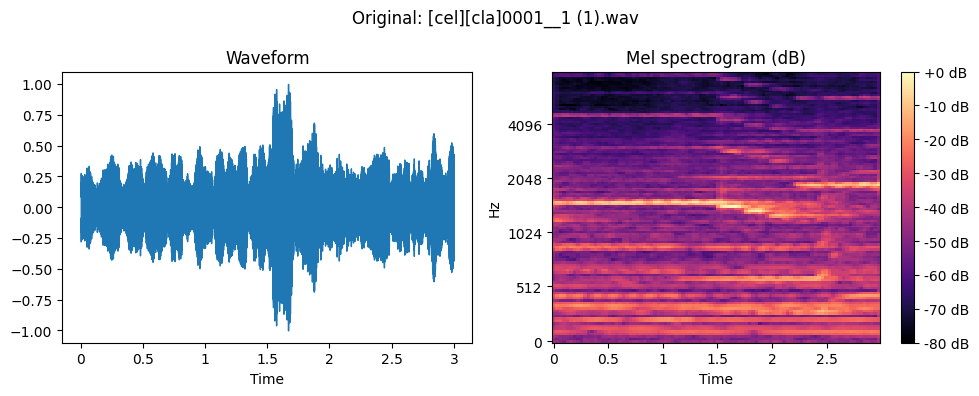

Saved: /content/augmented/[cel][cla]0001__1 (1)__time_stretch_0.90.wav


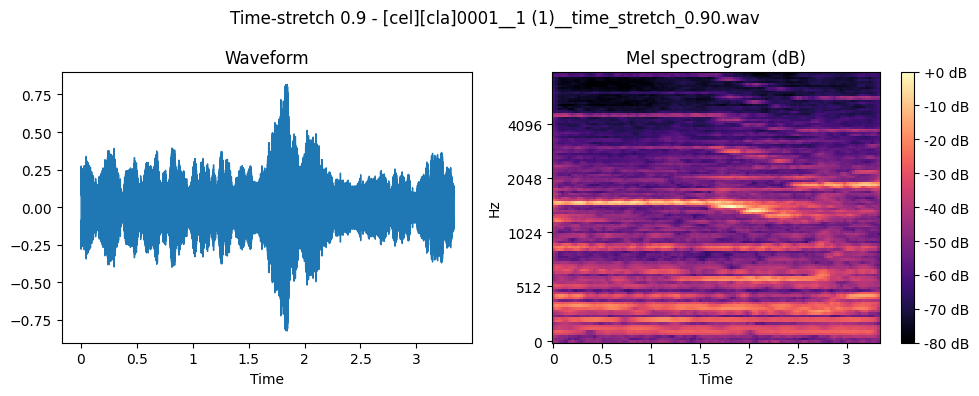

Saved: /content/augmented/[cel][cla]0001__1 (1)__time_stretch_1.10.wav


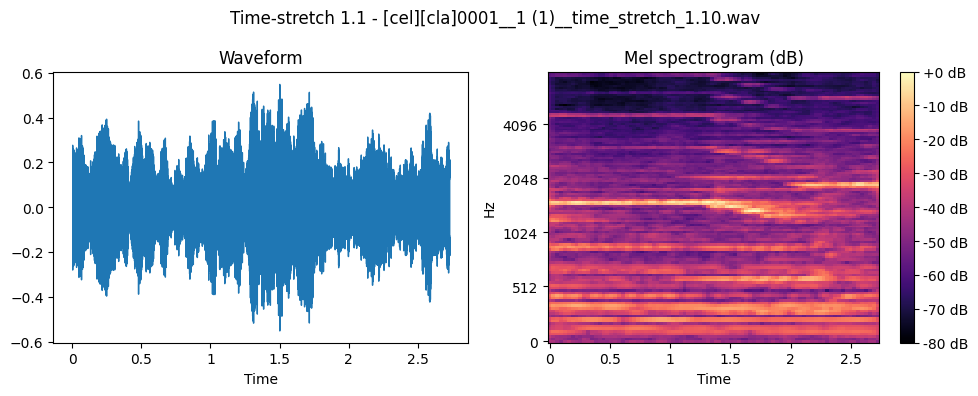

Saved: /content/augmented/[cel][cla]0001__1 (1)__hpss_h1.30_p0.80.wav


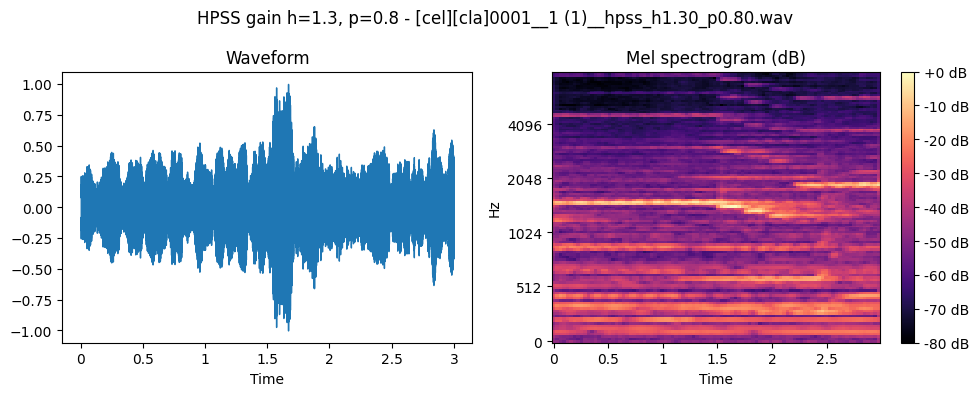

Saved: /content/augmented/[cel][cla]0001__1 (1)__hpss_h0.90_p1.20.wav


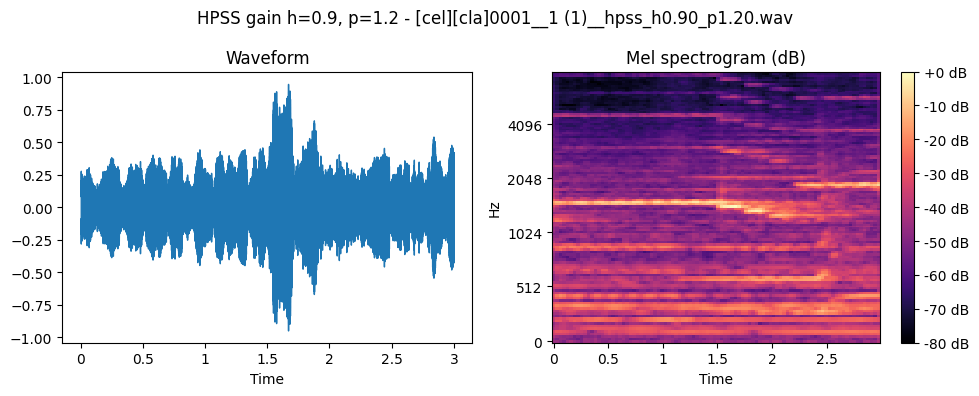

Saved: /content/augmented/[cel][cla]0001__1 (1)__gauss_snr20.wav


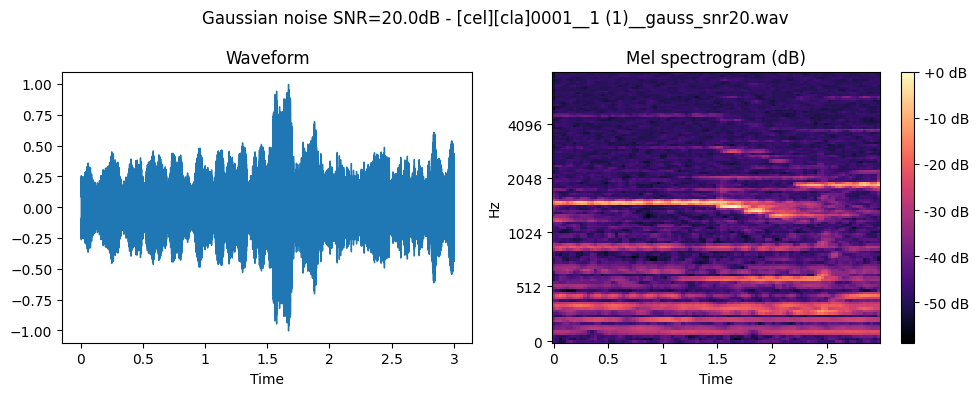


Processing: [cel][cla]0001__1 (2).wav sr: 16000 duration(s): 3.0


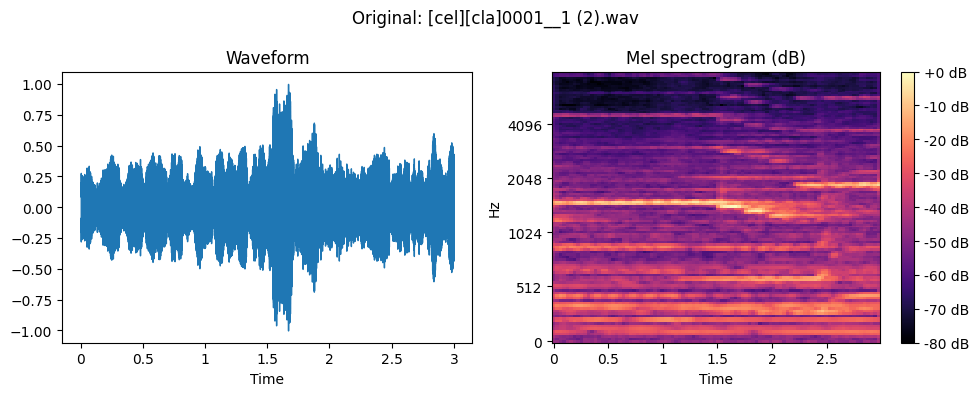

Saved: /content/augmented/[cel][cla]0001__1 (2)__time_stretch_0.90.wav


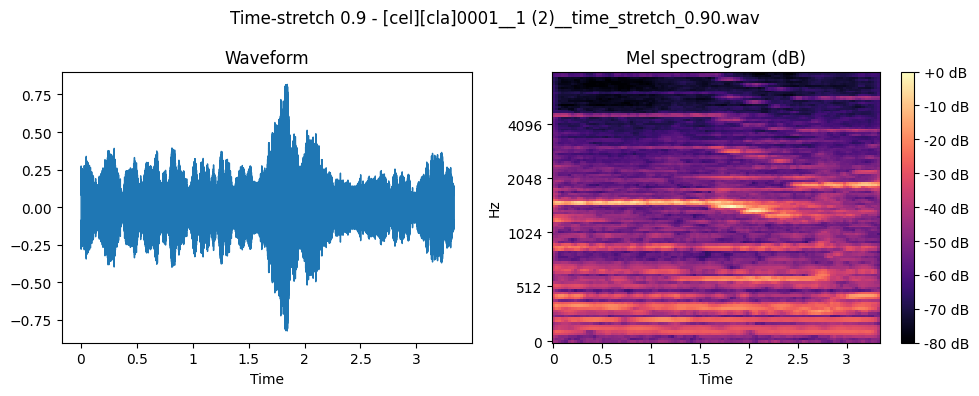

Saved: /content/augmented/[cel][cla]0001__1 (2)__time_stretch_1.10.wav


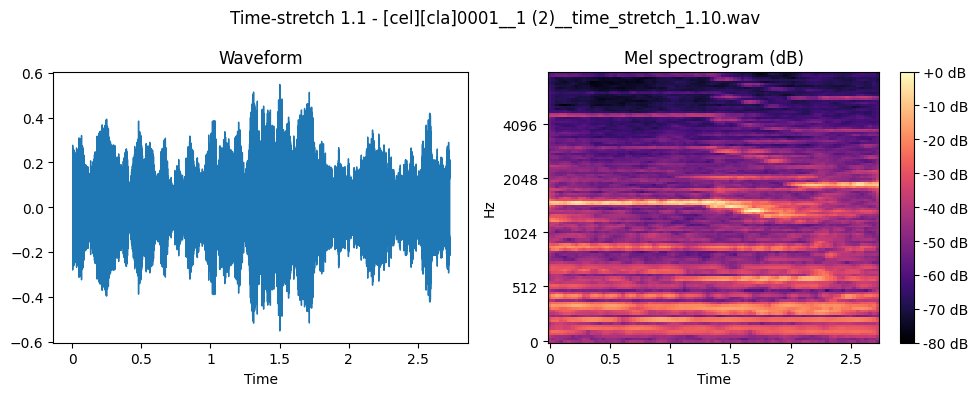

Saved: /content/augmented/[cel][cla]0001__1 (2)__hpss_h1.30_p0.80.wav


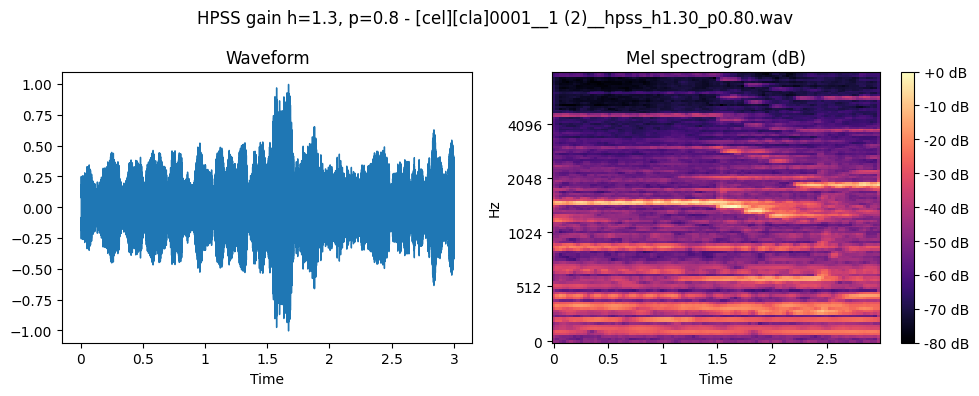

Saved: /content/augmented/[cel][cla]0001__1 (2)__hpss_h0.90_p1.20.wav


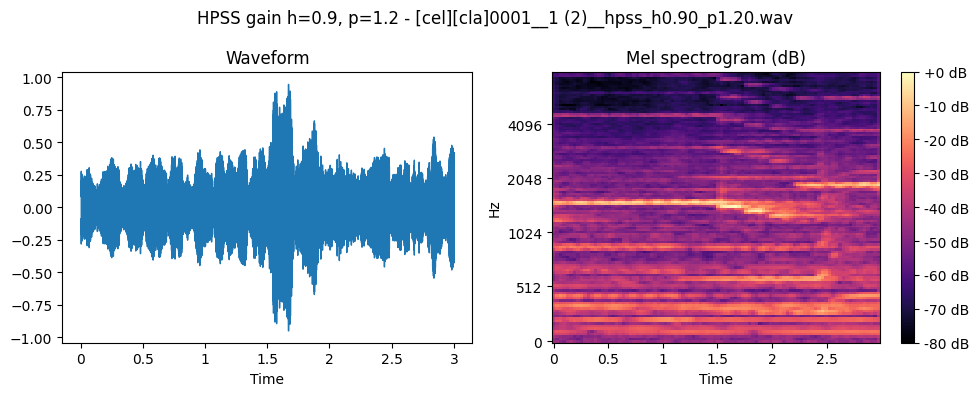

Saved: /content/augmented/[cel][cla]0001__1 (2)__gauss_snr20.wav


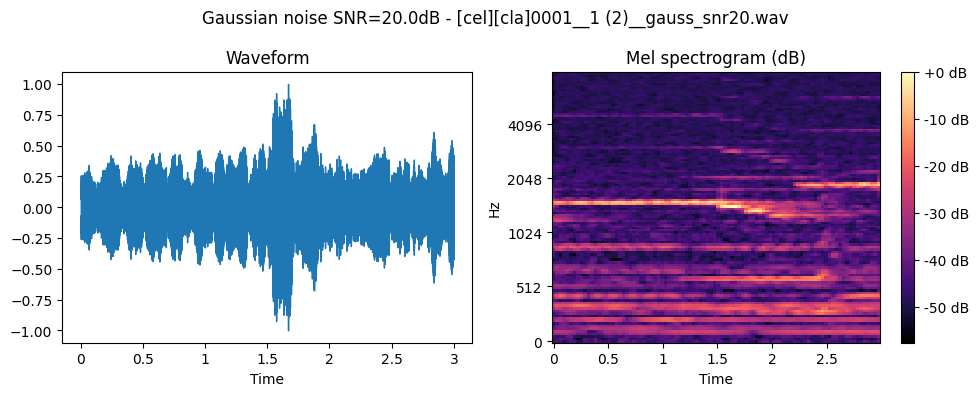


Processing: [cel][cla]0001__1.wav sr: 16000 duration(s): 3.0


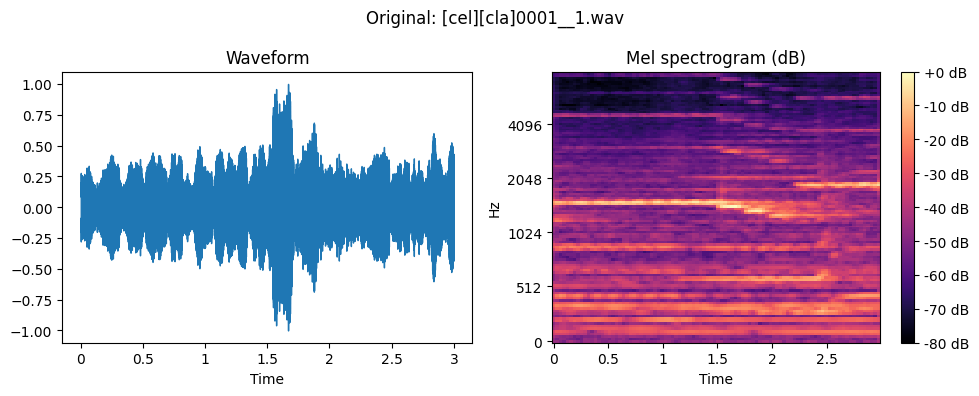

Saved: /content/augmented/[cel][cla]0001__1__time_stretch_0.90.wav


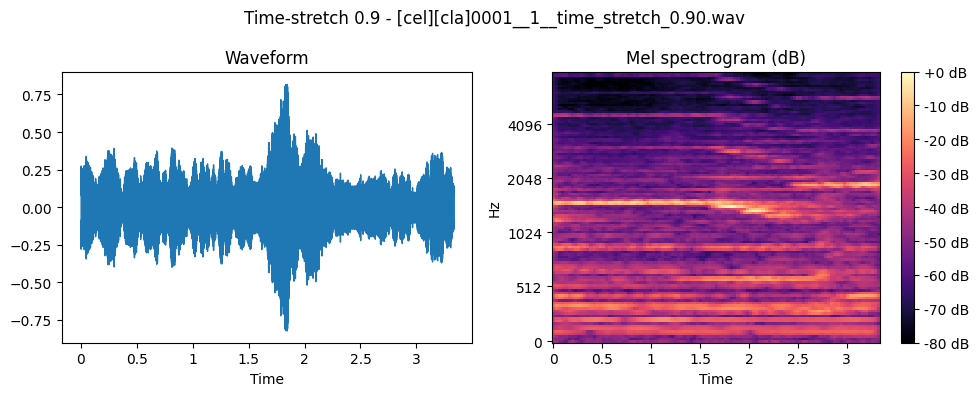

Saved: /content/augmented/[cel][cla]0001__1__time_stretch_1.10.wav


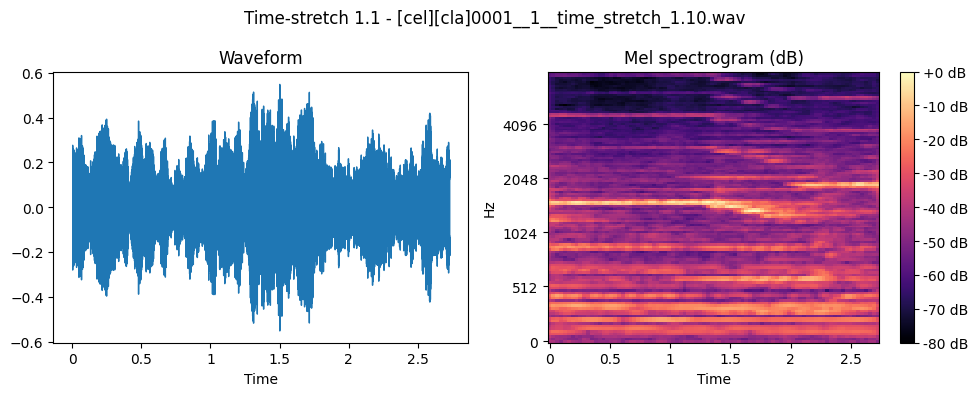

Saved: /content/augmented/[cel][cla]0001__1__hpss_h1.30_p0.80.wav


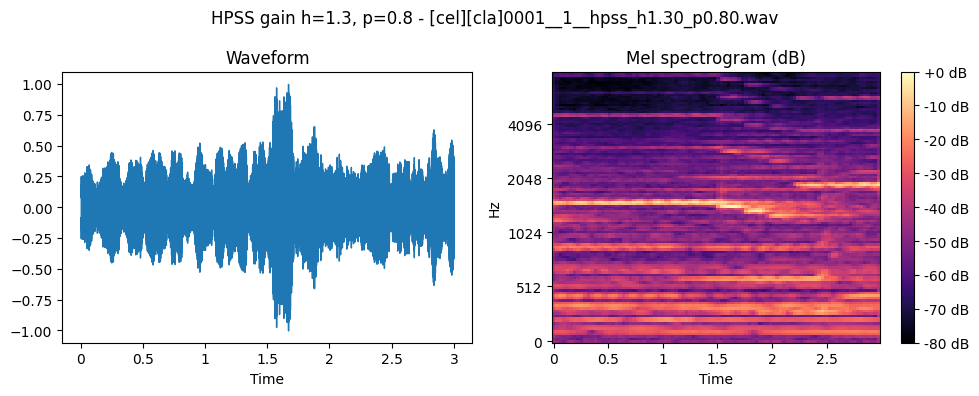

Saved: /content/augmented/[cel][cla]0001__1__hpss_h0.90_p1.20.wav


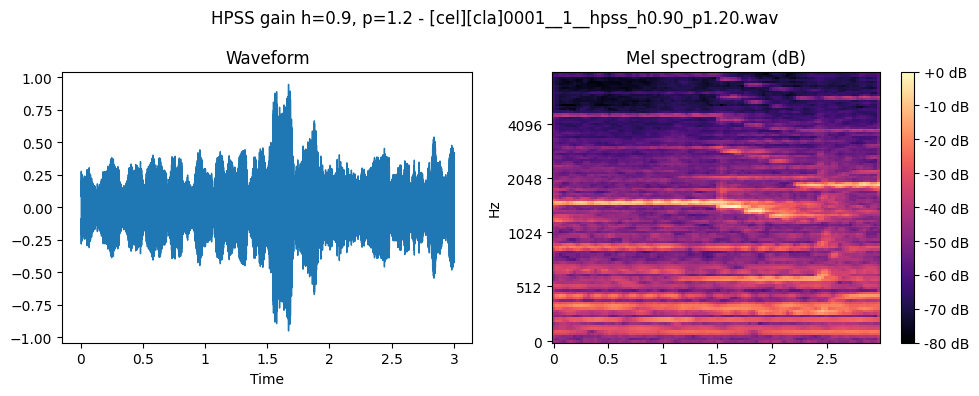

Saved: /content/augmented/[cel][cla]0001__1__gauss_snr20.wav


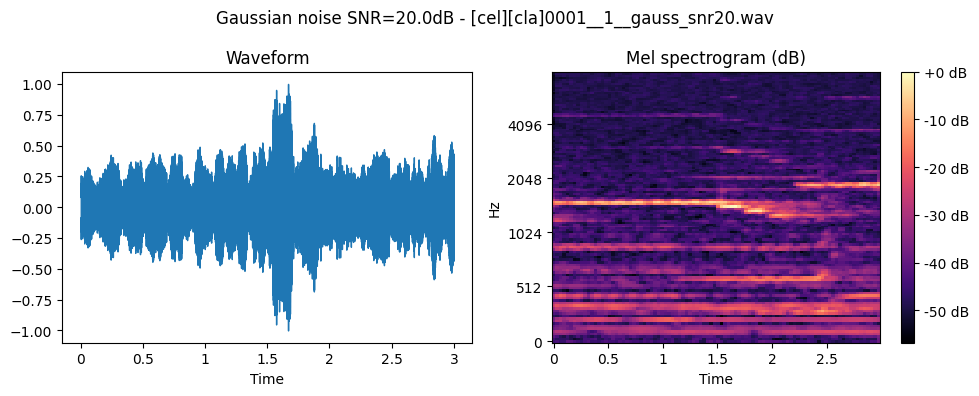


Processing: [flu][cla]0346__1 (1).wav sr: 16000 duration(s): 3.0


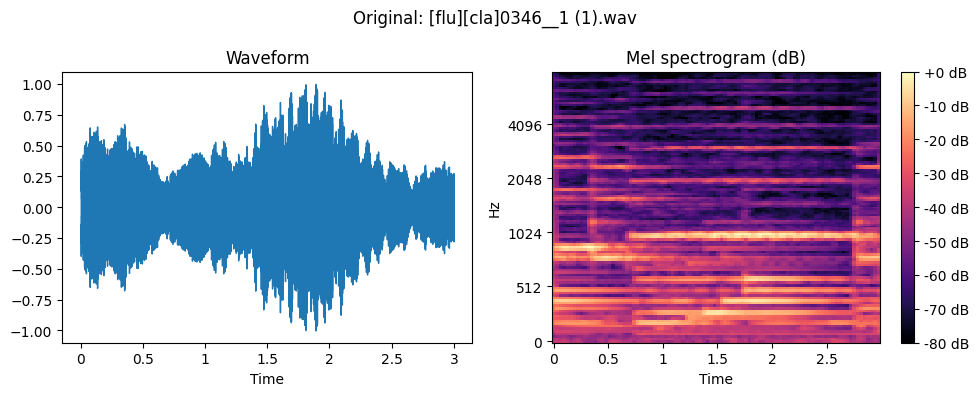

Saved: /content/augmented/[flu][cla]0346__1 (1)__time_stretch_0.90.wav


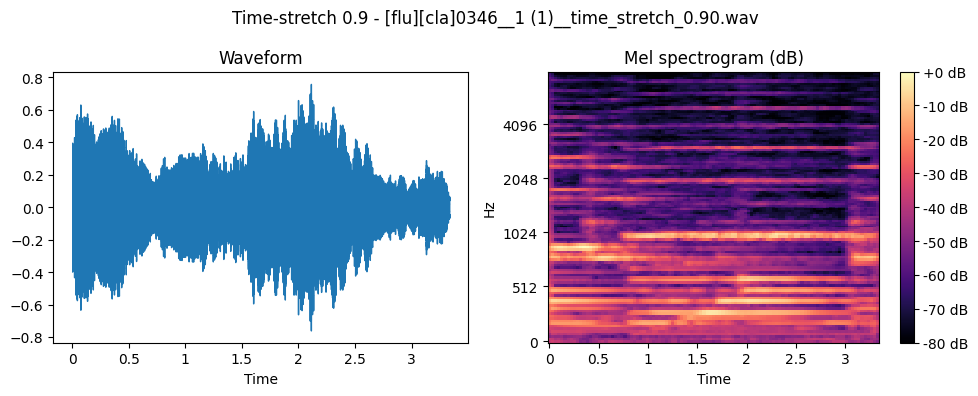

Saved: /content/augmented/[flu][cla]0346__1 (1)__time_stretch_1.10.wav


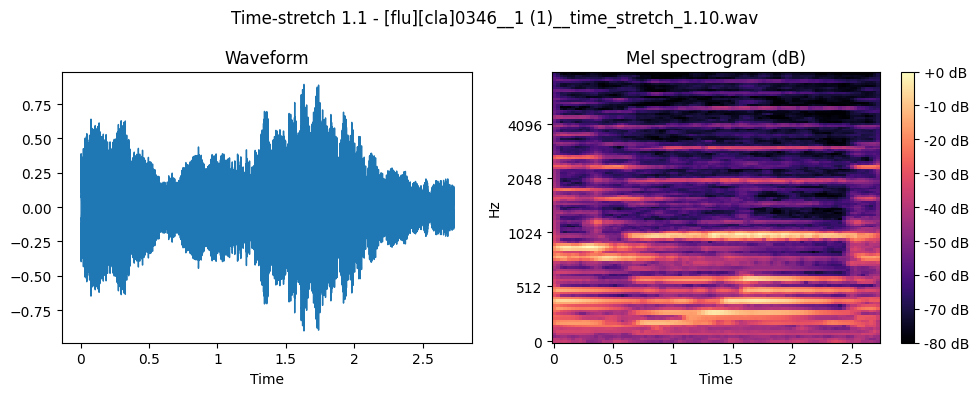

Saved: /content/augmented/[flu][cla]0346__1 (1)__hpss_h1.30_p0.80.wav


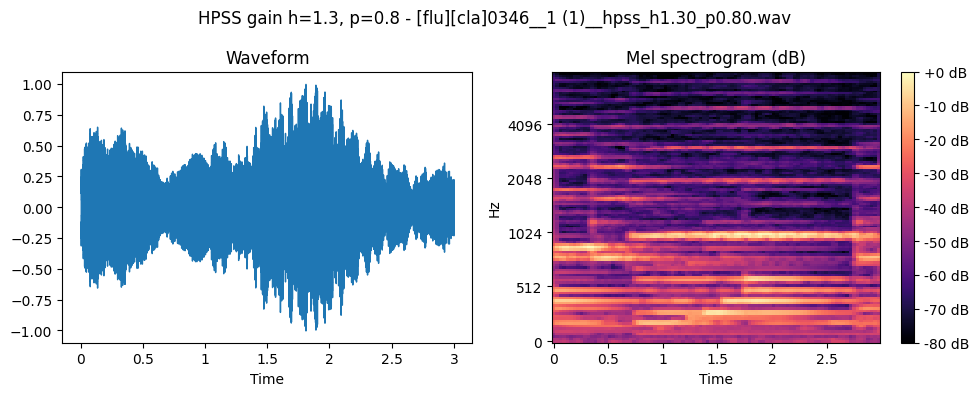

Saved: /content/augmented/[flu][cla]0346__1 (1)__hpss_h0.90_p1.20.wav


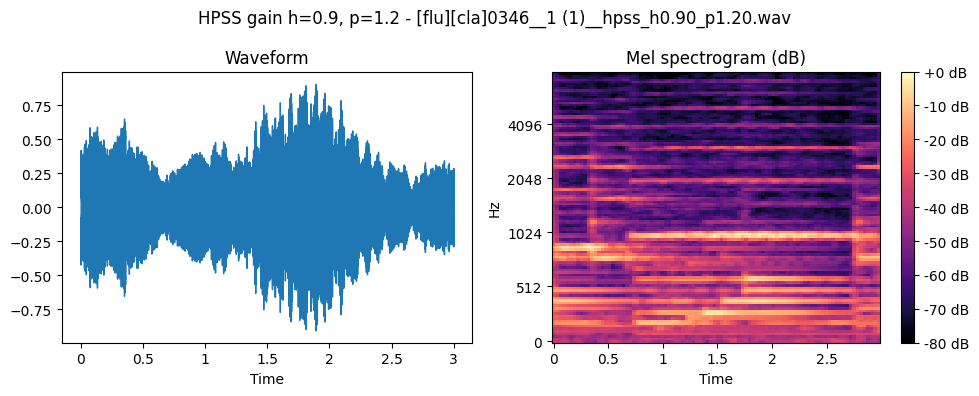

Saved: /content/augmented/[flu][cla]0346__1 (1)__gauss_snr20.wav


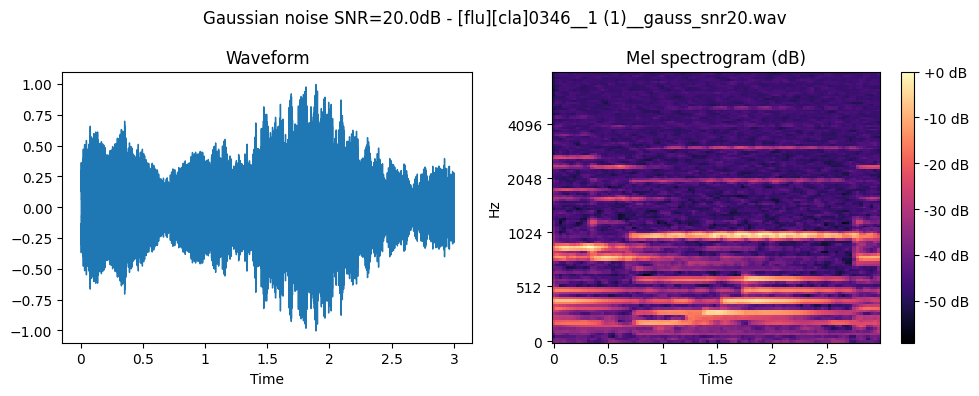


Processing: [flu][cla]0346__1 (2).wav sr: 16000 duration(s): 3.0


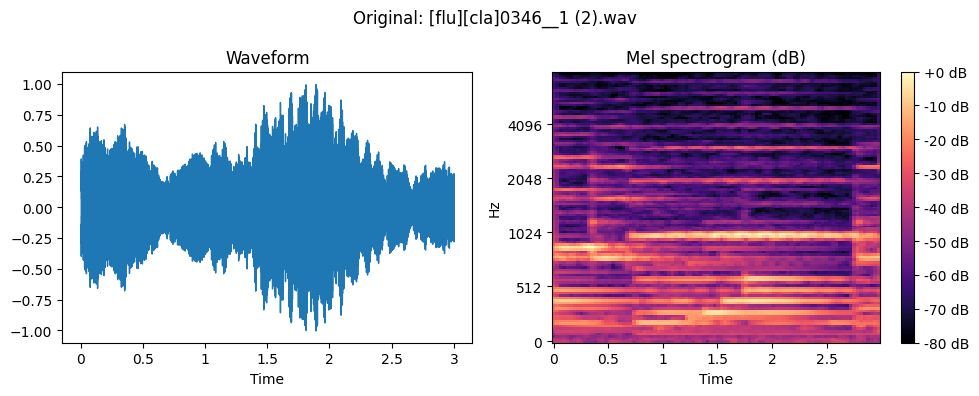

Saved: /content/augmented/[flu][cla]0346__1 (2)__time_stretch_0.90.wav


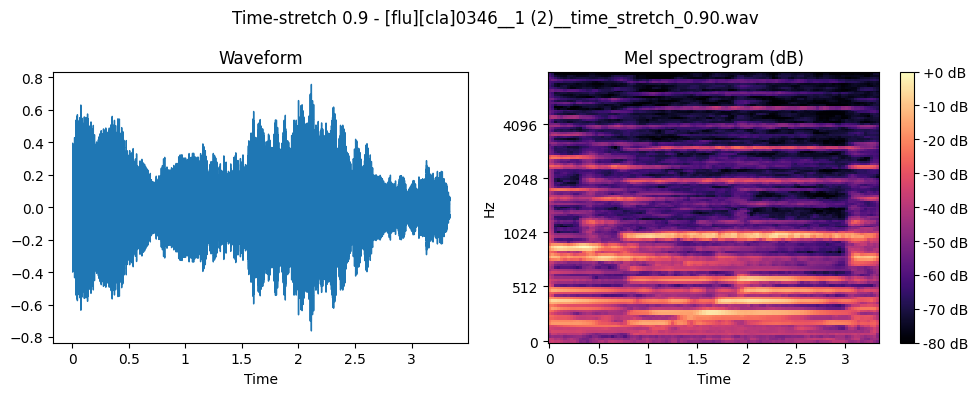

Saved: /content/augmented/[flu][cla]0346__1 (2)__time_stretch_1.10.wav


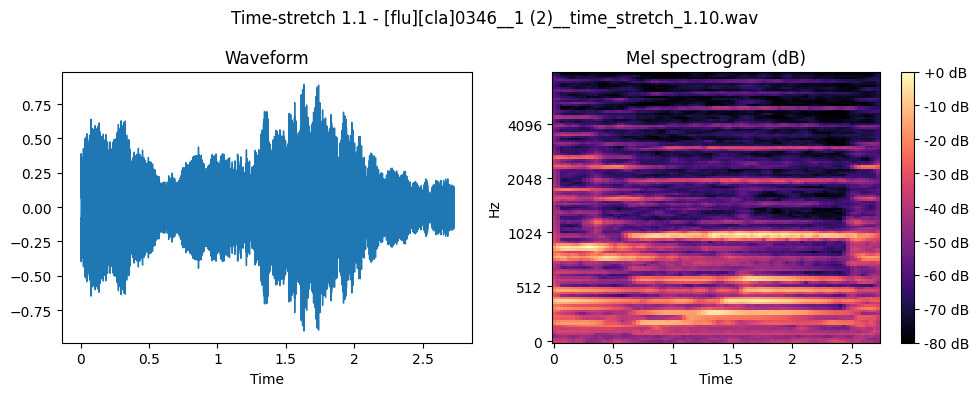

Saved: /content/augmented/[flu][cla]0346__1 (2)__hpss_h1.30_p0.80.wav


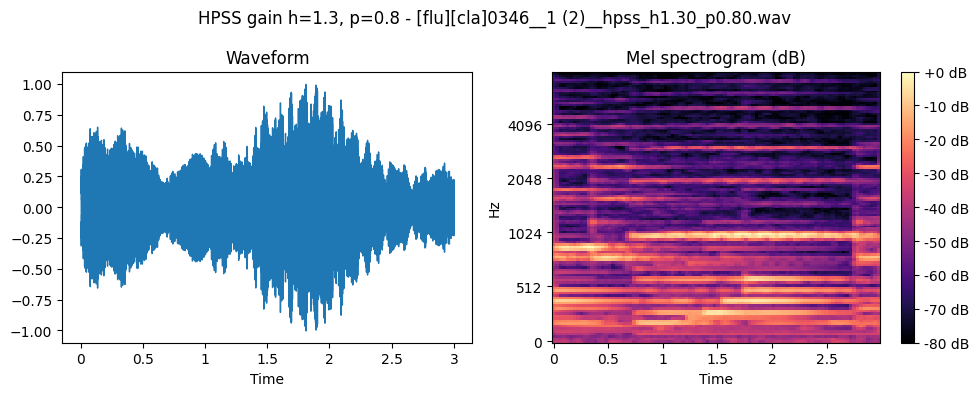

Saved: /content/augmented/[flu][cla]0346__1 (2)__hpss_h0.90_p1.20.wav


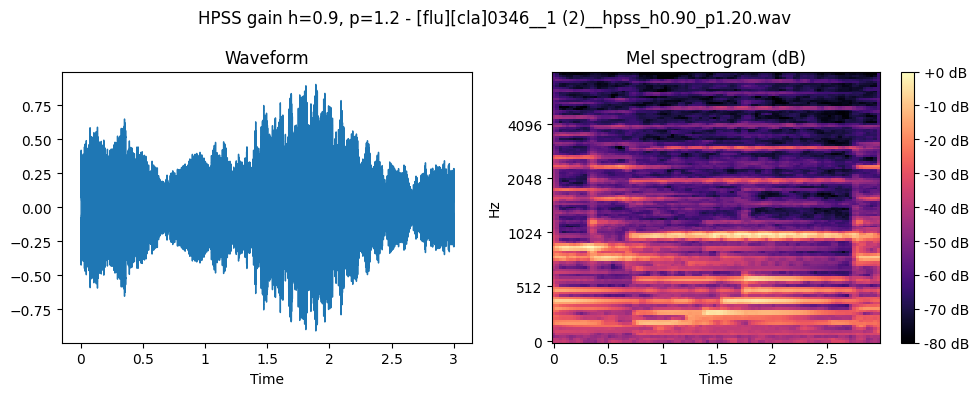

Saved: /content/augmented/[flu][cla]0346__1 (2)__gauss_snr20.wav


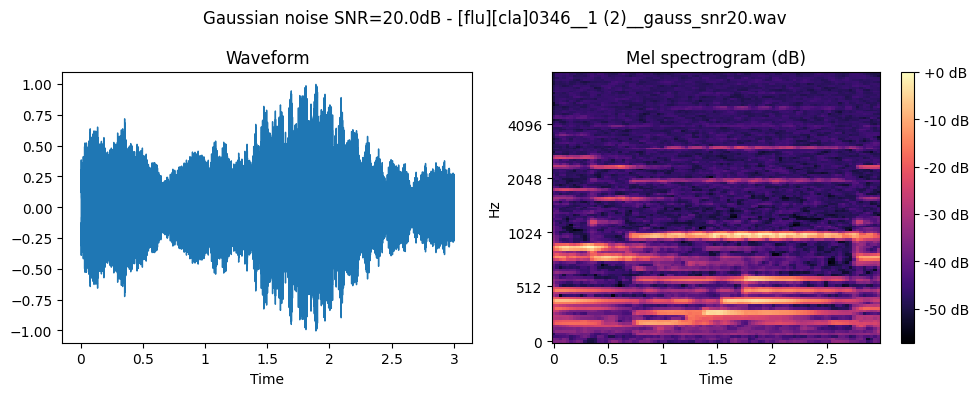


Processing: [flu][cla]0346__1.wav sr: 16000 duration(s): 3.0


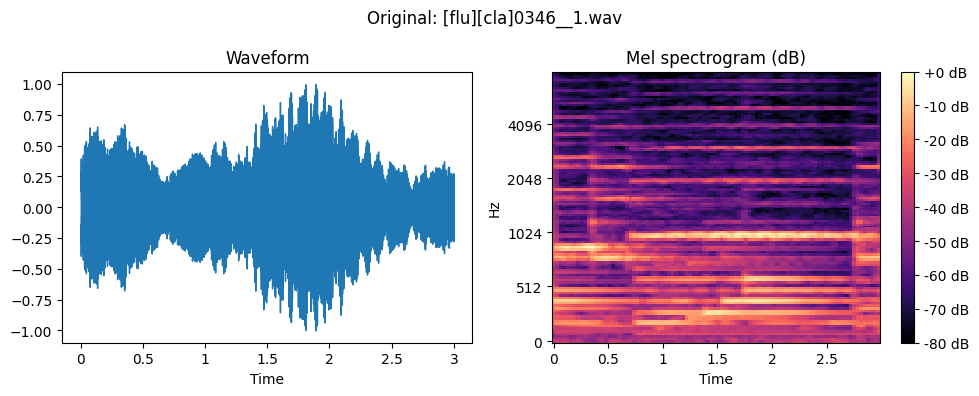

Saved: /content/augmented/[flu][cla]0346__1__time_stretch_0.90.wav


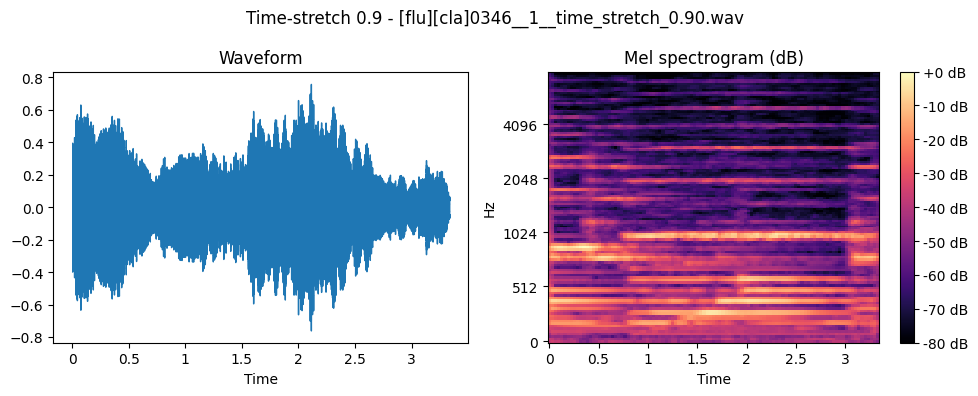

Saved: /content/augmented/[flu][cla]0346__1__time_stretch_1.10.wav


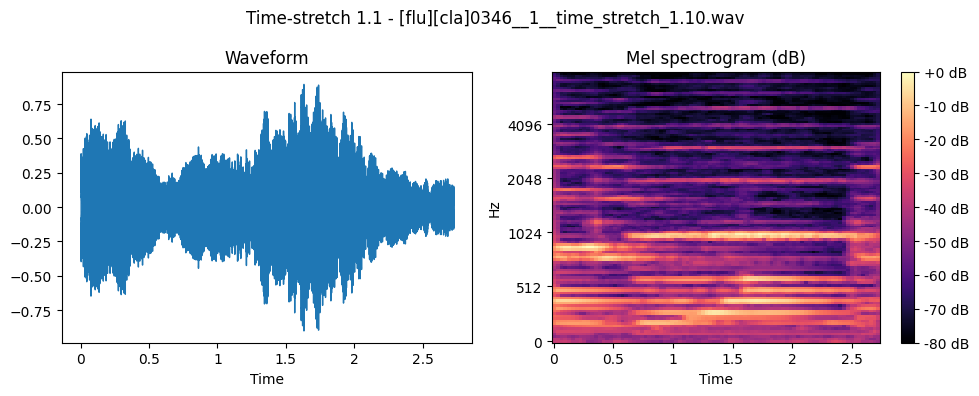

Saved: /content/augmented/[flu][cla]0346__1__hpss_h1.30_p0.80.wav


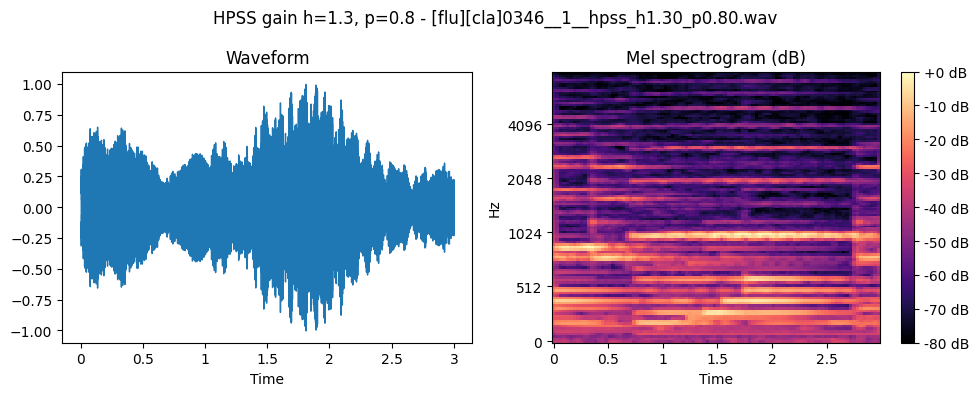

Saved: /content/augmented/[flu][cla]0346__1__hpss_h0.90_p1.20.wav


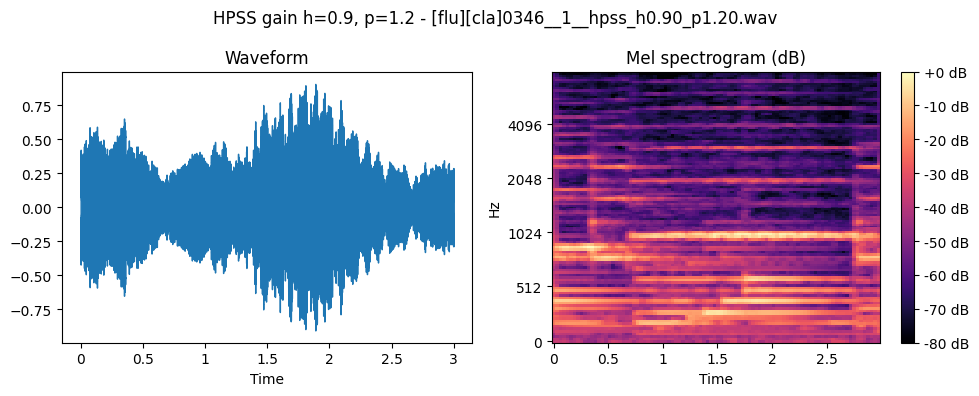

Saved: /content/augmented/[flu][cla]0346__1__gauss_snr20.wav


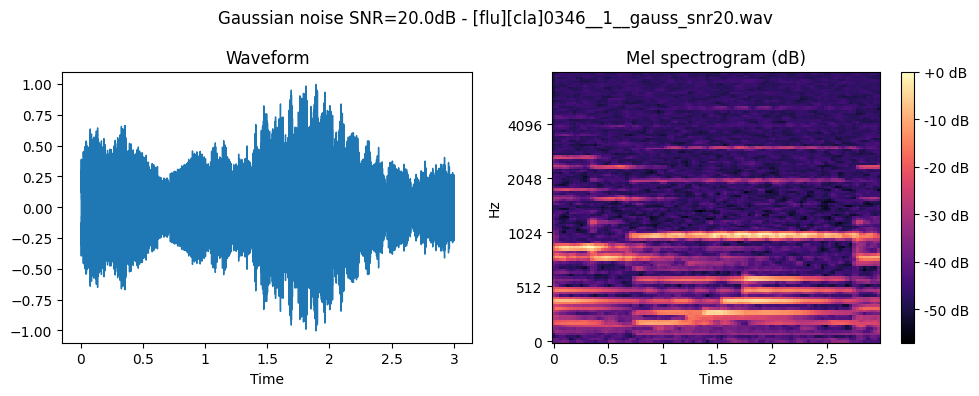


Processing: [pia][cla]1283__1 (1).wav sr: 16000 duration(s): 3.0


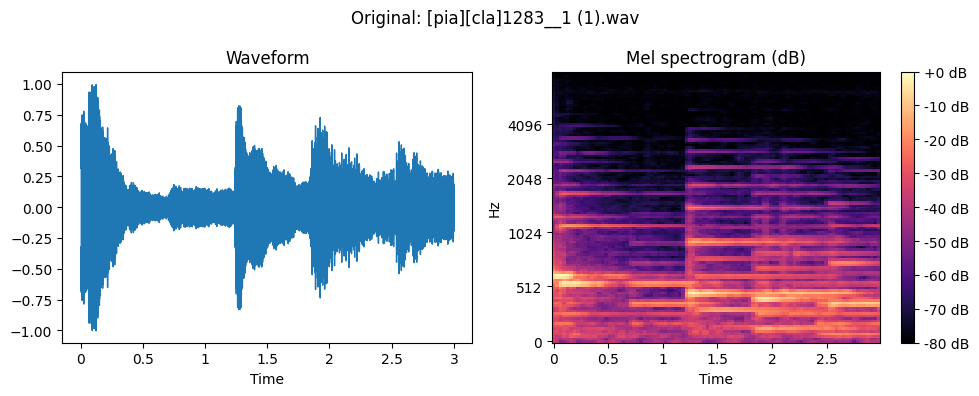

Saved: /content/augmented/[pia][cla]1283__1 (1)__time_stretch_0.90.wav


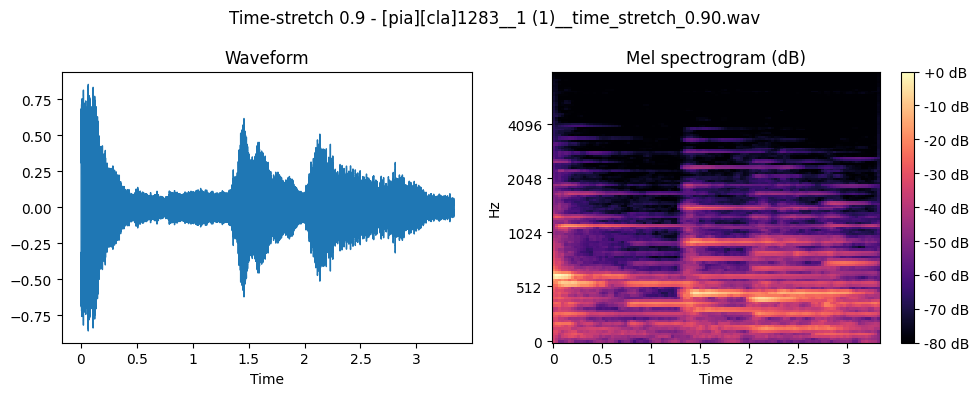

Saved: /content/augmented/[pia][cla]1283__1 (1)__time_stretch_1.10.wav


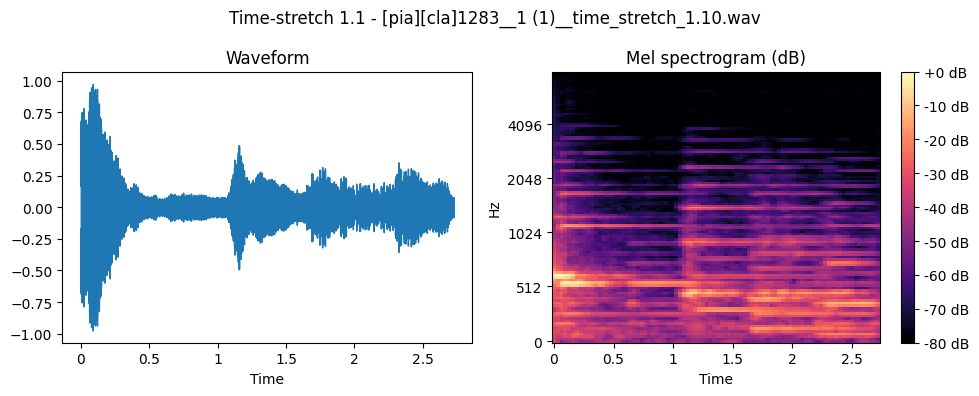

Saved: /content/augmented/[pia][cla]1283__1 (1)__hpss_h1.30_p0.80.wav


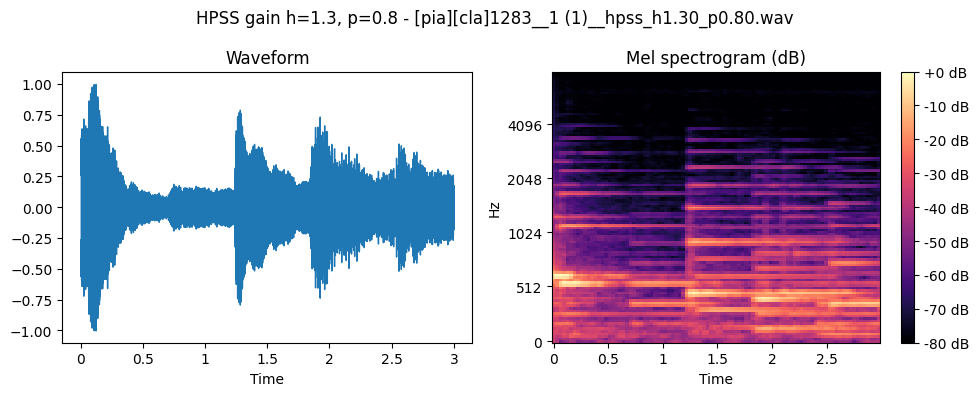

Saved: /content/augmented/[pia][cla]1283__1 (1)__hpss_h0.90_p1.20.wav


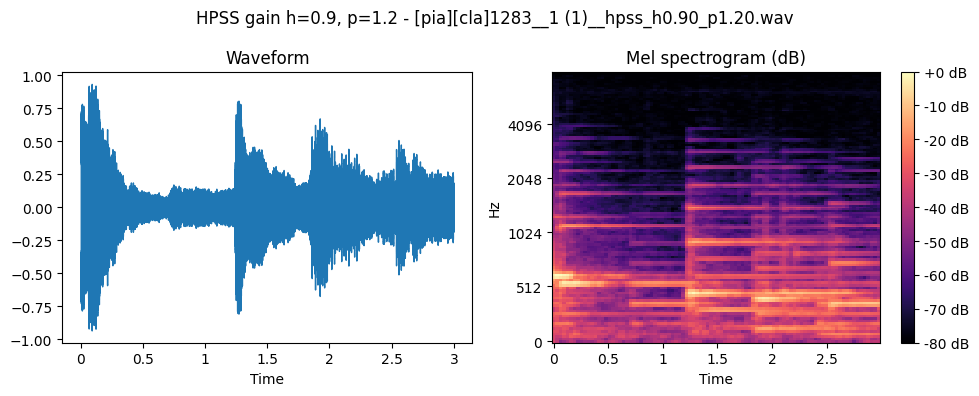

Saved: /content/augmented/[pia][cla]1283__1 (1)__gauss_snr20.wav


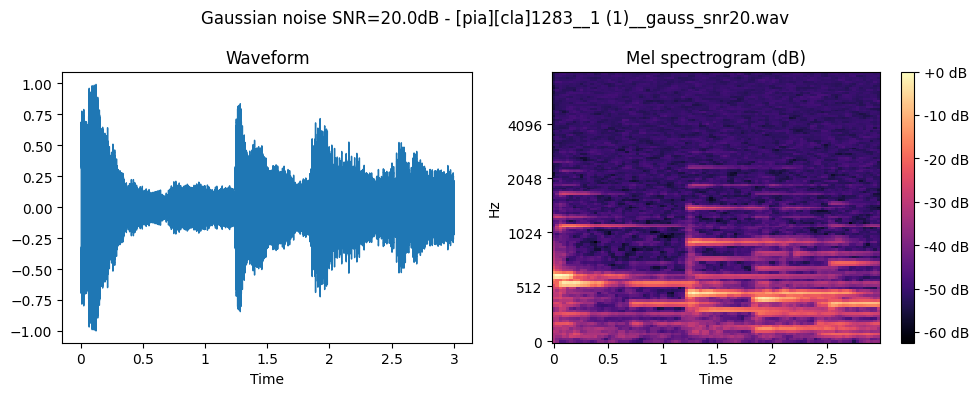


Processing: [pia][cla]1283__1 (2).wav sr: 16000 duration(s): 3.0


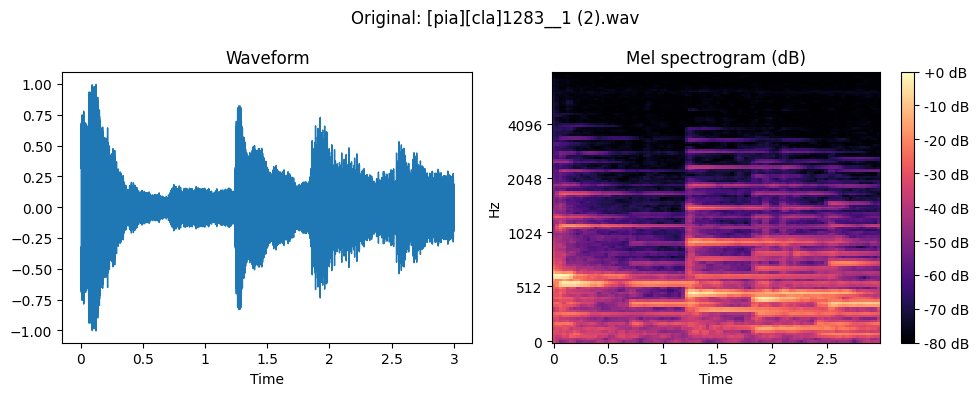

Saved: /content/augmented/[pia][cla]1283__1 (2)__time_stretch_0.90.wav


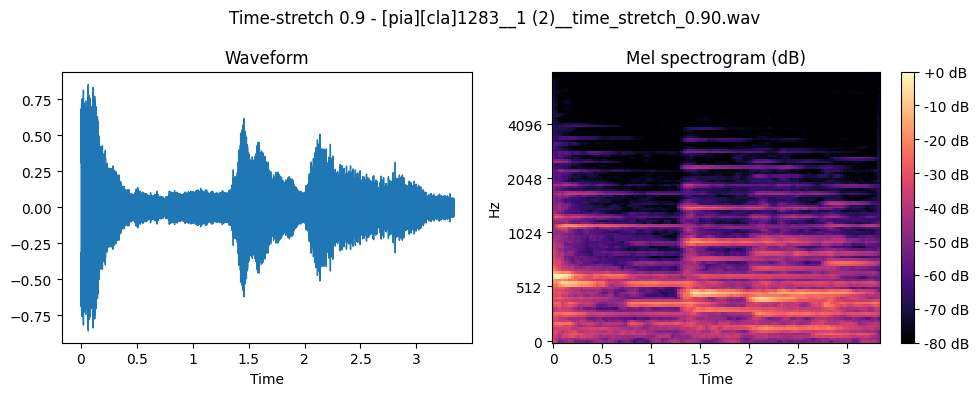

Saved: /content/augmented/[pia][cla]1283__1 (2)__time_stretch_1.10.wav


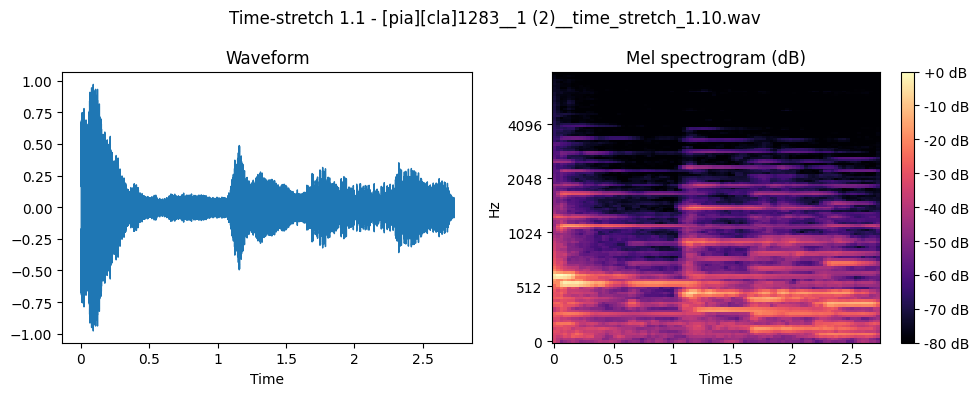

Saved: /content/augmented/[pia][cla]1283__1 (2)__hpss_h1.30_p0.80.wav


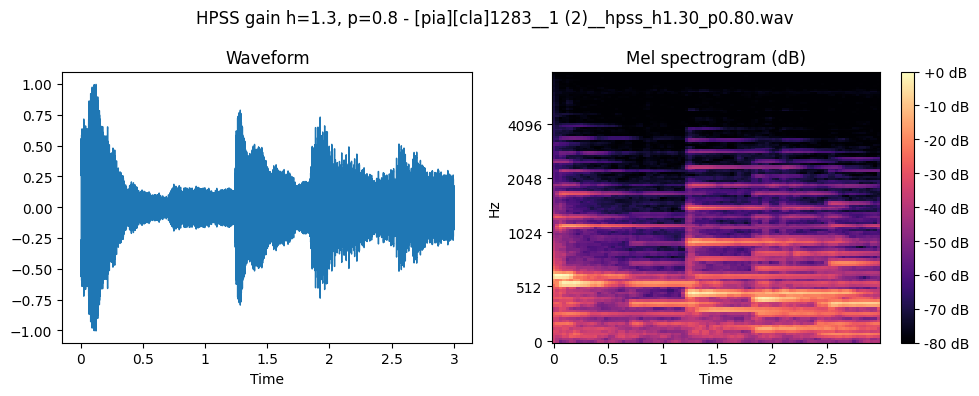

Saved: /content/augmented/[pia][cla]1283__1 (2)__hpss_h0.90_p1.20.wav


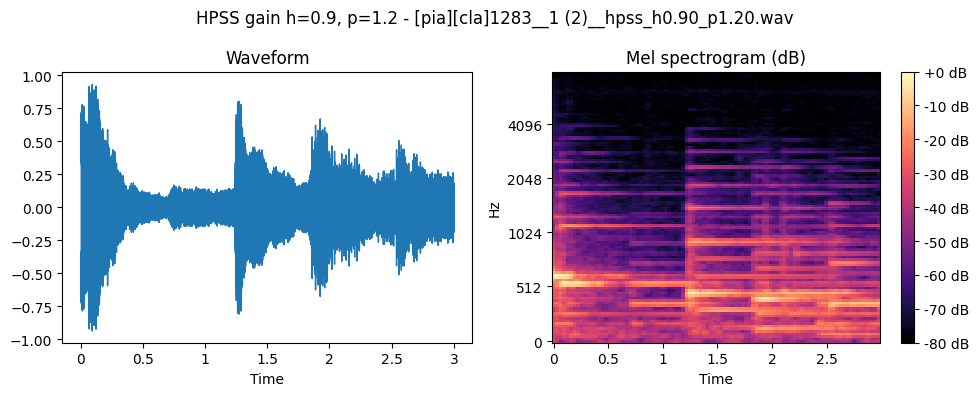

Saved: /content/augmented/[pia][cla]1283__1 (2)__gauss_snr20.wav


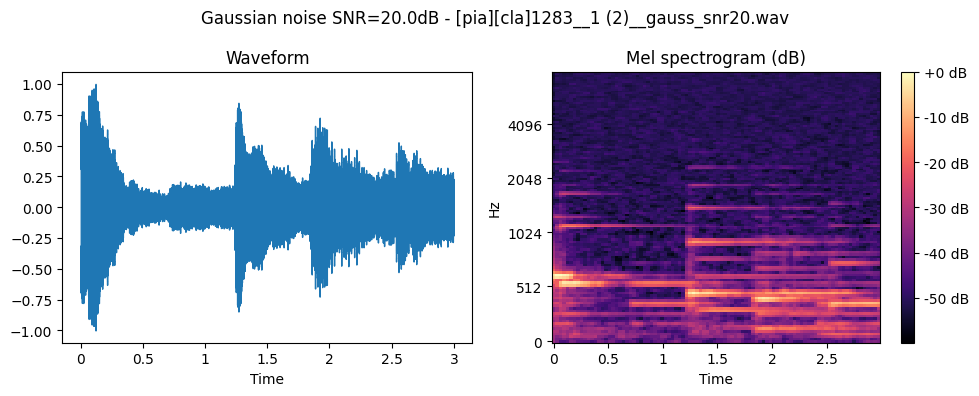


Processing: [pia][cla]1283__1.wav sr: 16000 duration(s): 3.0


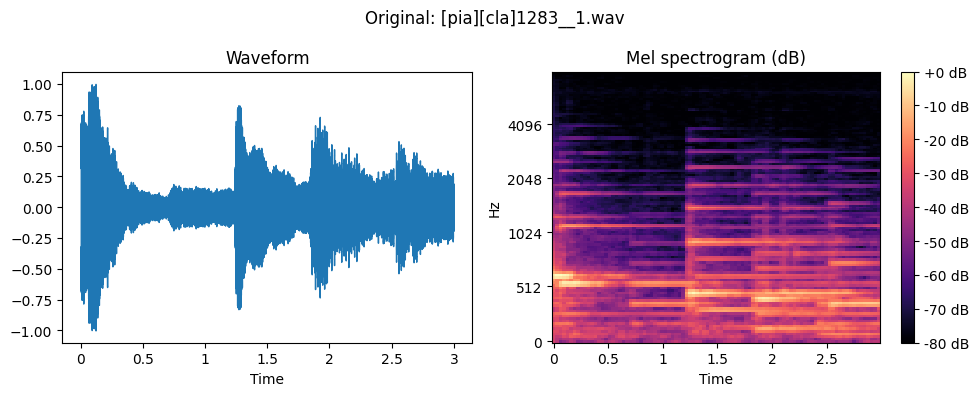

Saved: /content/augmented/[pia][cla]1283__1__time_stretch_0.90.wav


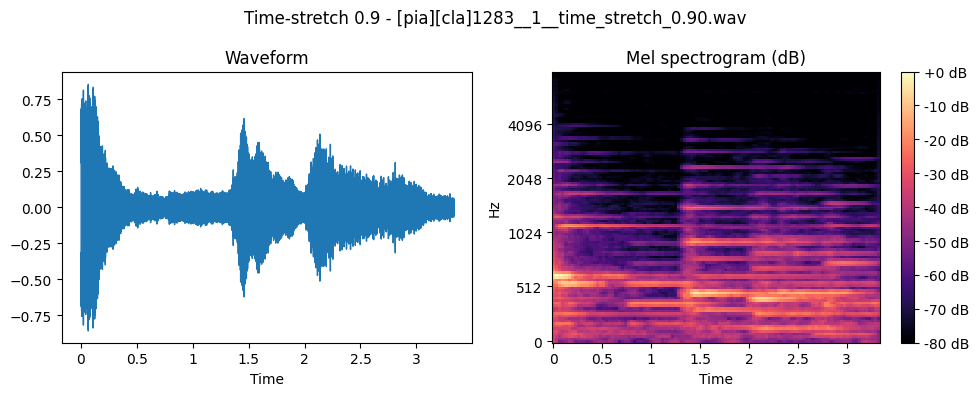

Saved: /content/augmented/[pia][cla]1283__1__time_stretch_1.10.wav


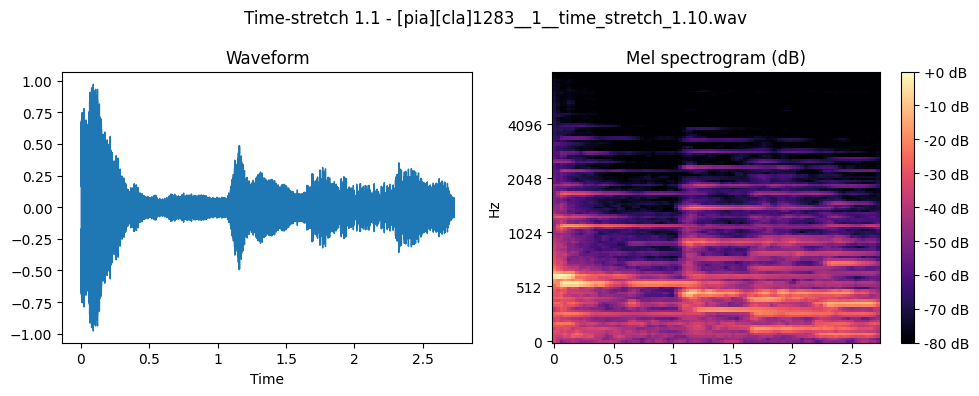

Saved: /content/augmented/[pia][cla]1283__1__hpss_h1.30_p0.80.wav


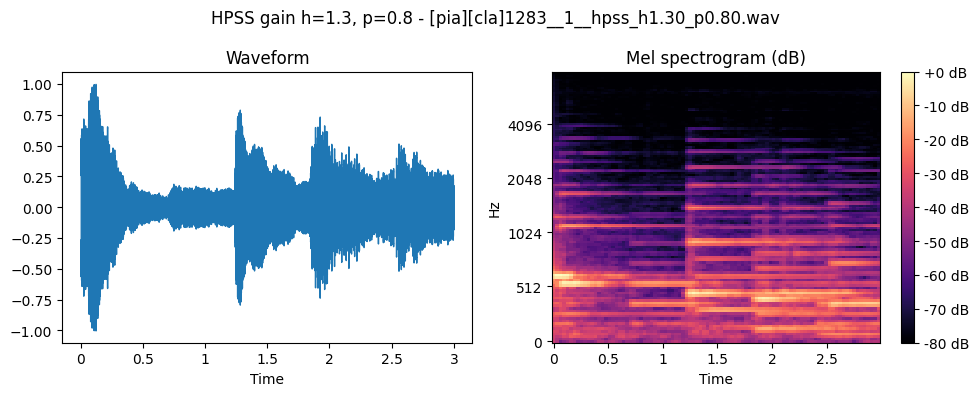

Saved: /content/augmented/[pia][cla]1283__1__hpss_h0.90_p1.20.wav


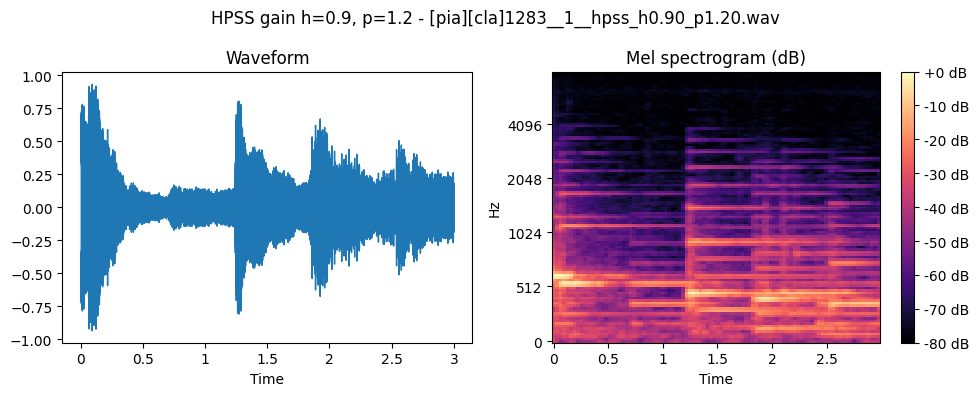

Saved: /content/augmented/[pia][cla]1283__1__gauss_snr20.wav


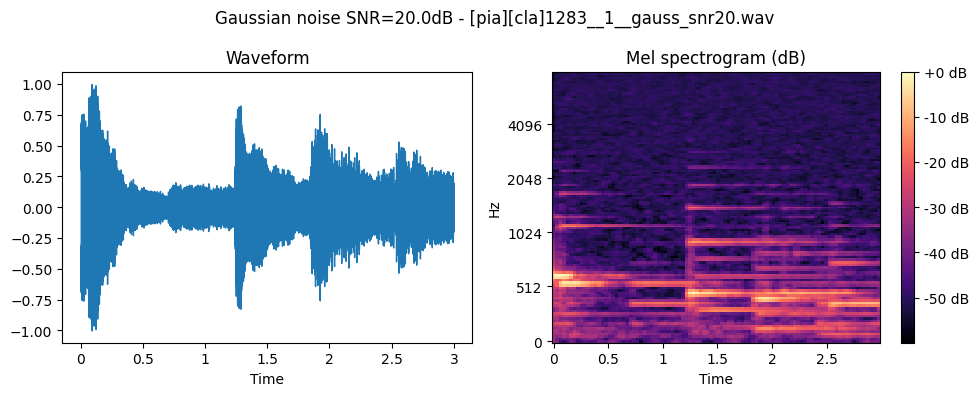


All augmented files saved to: /content/augmented
Files created: ['[flu][cla]0346__1 (1)__time_stretch_1.10.wav', '[cel][cla]0001__1 (2)__hpss_h0.90_p1.20.wav', '[flu][cla]0346__1 (2)__time_stretch_0.90.wav', '[cel][cla]0001__1 (1)__hpss_h0.90_p1.20.wav', '[flu][cla]0346__1 (2)__hpss_h1.30_p0.80.wav', '[cel][cla]0001__1__time_stretch_0.90.wav', '[flu][cla]0346__1 (1)__time_stretch_0.90.wav', '[cel][cla]0001__1 (1)__time_stretch_1.10.wav', '[pia][cla]1283__1 (1)__gauss_snr20.wav', '[cel][cla]0001__1__hpss_h1.30_p0.80.wav', '[cel][cla]0001__1__time_stretch_1.10.wav', '[flu][cla]0346__1__time_stretch_1.10.wav', '[pia][cla]1283__1__time_stretch_1.10.wav', '[cel][cla]0001__1__gauss_snr20.wav', '[pia][cla]1283__1 (1)__hpss_h0.90_p1.20.wav', '[pia][cla]1283__1 (2)__gauss_snr20.wav', '[flu][cla]0346__1 (1)__hpss_h1.30_p0.80.wav', '[pia][cla]1283__1__hpss_h1.30_p0.80.wav', '[pia][cla]1283__1 (1)__hpss_h1.30_p0.80.wav', '[flu][cla]0346__1__gauss_snr20.wav', '[cel][cla]0001__1 (2)__gauss_snr20.wa

In [ ]:
input_dir = '/content/audios'
sr_target = 16000  # use 16kHz as example; change if you prefer 22050 or 44100

# Choose augmentation parameters (you can modify these lists to generate more variants)
time_stretch_rates = [0.9, 1.1]      # slow_down by 0.9, speed_up by 1.1 (choose one per file if you want smaller dataset)
hpss_params = [(1.3, 0.8), (0.9, 1.2)] # pairs of (harmonic_gain, percussive_gain)
gaussian_snrs = [20.0]               # SNR in dB (lower => more noise)

summary = []
for fname in sorted(os.listdir(input_dir)):
    path = os.path.join(input_dir, fname)
    y, sr = load_audio(path, sr=sr_target, mono=True, normalize=True)
    base = os.path.splitext(fname)[0]
    print("\nProcessing:", fname, "sr:", sr, "duration(s):", len(y)/sr)
    # show original
    plot_wave_and_mel(y, sr, title=f"Original: {fname}")
    display(Audio(y, rate=sr))

    # 1) Time stretch (we'll create one stretched version per selected rate)
    for r in time_stretch_rates:
        try:
            y_ts = augment_time_stretch(y, rate=r)
        except Exception as e:
            # time_stretch may fail for very short signals; fallback: use resampling based method
            print("time_stretch failed:", e)
            y_ts = librosa.resample(y, orig_sr=sr, target_sr=int(sr*r))  # fallback (not ideal)
        out_name = f"{base}__time_stretch_{r:.2f}.wav"
        out_path = os.path.join(OUTPUT_DIR, out_name)
        save_audio(out_path, y_ts, sr)
        print("Saved:", out_path)
        plot_wave_and_mel(y_ts, sr, title=f"Time-stretch {r} - {out_name}")
        display(Audio(y_ts, rate=sr))
        summary.append(out_path)

    # 2) Harmonic / Percussive re-weighting (create one or more variants)
    for hg, pg in hpss_params:
        y_hpss = augment_hpss_mix(y, harmonic_gain=hg, percussive_gain=pg)
        out_name = f"{base}__hpss_h{hg:.2f}_p{pg:.2f}.wav"
        out_path = os.path.join(OUTPUT_DIR, out_name)
        save_audio(out_path, y_hpss, sr)
        print("Saved:", out_path)
        plot_wave_and_mel(y_hpss, sr, title=f"HPSS gain h={hg}, p={pg} - {out_name}")
        display(Audio(y_hpss, rate=sr))
        summary.append(out_path)

    # 3) Gaussian noise augmentations
    for snr in gaussian_snrs:
        y_g = augment_add_gaussian_noise(y, snr_db=snr)
        out_name = f"{base}__gauss_snr{int(snr)}.wav"
        out_path = os.path.join(OUTPUT_DIR, out_name)
        save_audio(out_path, y_g, sr)
        print("Saved:", out_path)
        plot_wave_and_mel(y_g, sr, title=f"Gaussian noise SNR={snr}dB - {out_name}")
        display(Audio(y_g, rate=sr))
        summary.append(out_path)

print("\nAll augmented files saved to:", OUTPUT_DIR)
print("Files created:", os.listdir(OUTPUT_DIR))

## Step 5: Downloading to local machine

In [ ]:
import shutil
from google.colab import files

# Define the folder to zip and the output filename
folder_to_zip = '/content/augmented'
zip_filename = '/content/augmented_audio_files.zip'

print(f"Zipping folder: {folder_to_zip}...")

# Create the zip archive
# make_archive takes the base_name (without extension), format, and root_dir
shutil.make_archive(zip_filename.replace('.zip', ''), 'zip', folder_to_zip)

print(f"Created: {zip_filename}")
print("Triggering download...")

# Trigger the browser download
files.download(zip_filename)

Zipping folder: /content/augmented...
Created: /content/augmented_audio_files.zip
Triggering download...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Step 6: Conclusion

### In this experiment, we successfully built a data augmentation pipeline to expand a small dataset of 3 audio files into a larger, more diverse dataset. Here is what our results signify:

### **1. Dataset Multiplication (Quantity)**
### We achieved a 5x increase in our dataset size. By generating multiple variants (Time Stretch, HPSS, and Noise) for every single original file, we turned 3 raw inputs into a robust set of training examples. In a real-world scenario (like Deep Learning), this helps prevent the model from memorizing the few original files.

### **2. Model Robustness (Quality)**
### The specific augmentations we chose signify different types of "invariance" we want our model to learn:

### (a) Time Stretch Results:

### Significance: These files force the model to learn that the "speed" of the audio does not change its class. A cello is still a cello, whether played quickly or slowly.

### (b) HPSS (Harmonic/Percussive) Results:

### Significance: By remixing harmonic (smooth) and percussive (sharp) elements, we simulate different recording microphones or playing styles. This teaches the model to focus on the underlying structure of the sound rather than just the specific balance of frequencies.

### (c) Gaussian Noise Results:

### Significance: The noisy variants simulate real-world environments (e.g., street noise, bad cables). This prevents the model from relying on "silence" to identify audio and forces it to find the signal amidst the noise.

### 3. Visual Verification
### The Mel-Spectrogram plots generated for each file served as a crucial quality check. They visually confirmed that while the pixel patterns changed (shifting left/right for time stretch, or becoming grainy for noise), the fundamental "shape" of the sound (the features that distinguish a flute from a piano) remained intact.

### **Final Verdict**
### The generated augmented_audio_files.zip now contains a dataset that is not only larger but mathematically designed to train a more generalized and resilient Audio Classification model.